<a href="https://colab.research.google.com/github/nidub/Gemstone-Price-Prediction-using-Streamlit/blob/main/gemstones_price_prediction01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

In [ ]:
train = pd.read_csv("/content/train.csv").drop(columns='id')
test = pd.read_csv("/content/test.csv")
submission = pd.read_csv("/content/sample_submission.csv")
original = pd.read_csv("/content/cubic_zirconia.csv").drop(columns='Unnamed: 0')

In [ ]:
print(train.head())
print(test.head())
print(submission.head())
print(original.head())

   carat        cut color clarity  depth  table     x     y     z  price
0   1.52    Premium     F     VS2   62.2   58.0  7.27  7.33  4.55  13619
1   2.03  Very Good     J     SI2   62.0   58.0  8.06  8.12  5.05  13387
2   0.70      Ideal     G     VS1   61.2   57.0  5.69  5.73  3.50   2772
3   0.32      Ideal     G     VS1   61.6   56.0  4.38  4.41  2.71    666
4   1.70    Premium     G     VS2   62.6   59.0  7.65  7.61  4.77  14453
       id  carat        cut color clarity  depth  table     x     y     z
0  193573   0.35      Ideal     D     VS2   62.3   56.0  4.51  4.54  2.82
1  193574   0.77  Very Good     F     SI2   62.8   56.0  5.83  5.87  3.68
2  193575   0.71      Ideal     I     VS2   61.9   53.0  5.77  5.74  3.55
3  193576   0.33      Ideal     G    VVS2   61.6   55.0  4.44  4.42  2.73
4  193577   1.20  Very Good     I     VS2   62.7   56.0  6.75  6.79  4.24
       id     price
0  193573  3969.155
1  193574  3969.155
2  193575  3969.155
3  193576  3969.155
4  193577  3969.15

In [ ]:
print(train.tail())
print(test.tail())
print(submission.tail())
print(original.tail())

        carat        cut color clarity  depth  table     x     y     z  price
193568   0.31      Ideal     D    VVS2   61.1   56.0  4.35  4.39  2.67   1130
193569   0.70    Premium     G    VVS2   60.3   58.0  5.75  5.77  3.47   2874
193570   0.73  Very Good     F     SI1   63.1   57.0  5.72  5.75  3.62   3036
193571   0.34  Very Good     D     SI1   62.9   55.0  4.45  4.49  2.81    681
193572   0.71       Good     E     SI2   60.8   64.0  5.73  5.71  3.48   2258
            id  carat      cut color clarity  depth  table     x     y     z
129045  322618   0.72    Ideal     D    VVS2   62.0   56.0  5.75  5.78  3.57
129046  322619   0.70  Premium     D     SI1   59.6   62.0  5.77  5.74  3.43
129047  322620   1.01  Premium     G    VVS2   62.3   58.0  6.44  6.41  4.01
129048  322621   1.35    Ideal     D      I1   62.0   56.0  7.05  7.08  4.38
129049  322622   1.07  Premium     H     SI2   62.6   60.0  6.49  6.45  4.06
            id     price
129045  322618  3969.155
129046  322619  3969

In [ ]:
df = pd.concat([train, original],ignore_index=True,axis=0).drop_duplicates()

In [ ]:
df

,carat,cut,color,clarity,depth,table,x,y,z,price
0,1.52,Premium,F,VS2,62.2,58.0,7.27,7.33,4.55,13619
1,2.03,Very Good,J,SI2,62.0,58.0,8.06,8.12,5.05,13387
2,0.70,Ideal,G,VS1,61.2,57.0,5.69,5.73,3.50,2772
3,0.32,Ideal,G,VS1,61.6,56.0,4.38,4.41,2.71,666
4,1.70,Premium,G,VS2,62.6,59.0,7.65,7.61,4.77,14453
...,...,...,...,...,...,...,...,...,...,...
220535,1.11,Premium,G,SI1,62.3,58.0,6.61,6.52,4.09,5408
220536,0.33,Ideal,H,IF,61.9,55.0,4.44,4.42,2.74,1114
220537,0.51,Premium,E,VS2,61.7,58.0,5.12,5.15,3.17,1656
220538,0.27,Very Good,F,VVS2,61.8,56.0,4.19,4.20,2.60,682


In [ ]:
df.shape

(220275, 10)

In [ ]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'x', 'y', 'z',
       'price'],
      dtype='object')

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

carat        0
cut          0
color        0
clarity      0
depth      697
table        0
x            0
y            0
z            0
price        0
dtype: int64

In [ ]:
df = df.dropna(subset=['depth'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 219578 entries, 0 to 220539
Data columns (total 10 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   carat    219578 non-null  float64
 1   cut      219578 non-null  object 
 2   color    219578 non-null  object 
 3   clarity  219578 non-null  object 
 4   depth    219578 non-null  float64
 5   table    219578 non-null  float64
 6   x        219578 non-null  float64
 7   y        219578 non-null  float64
 8   z        219578 non-null  float64
 9   price    219578 non-null  int64  
dtypes: float64(6), int64(1), object(3)
memory usage: 18.4+ MB


In [ ]:
df.describe()

,carat,depth,table,x,y,z,price
count,219578.000000,219578.000000,219578.000000,219578.000000,219578.000000,219578.000000,219578.000000
mean,0.791891,61.811511,57.255526,5.717986,5.722658,3.535163,3967.596244
std,0.464328,1.126880,1.960297,1.111195,1.109779,0.689936,4032.601837
min,0.200000,50.800000,49.000000,0.000000,0.000000,0.000000,326.000000
25%,0.400000,61.200000,56.000000,4.700000,4.710000,2.900000,952.000000
50%,0.700000,61.900000,57.000000,5.700000,5.720000,3.530000,2401.000000
75%,1.030000,62.400000,58.000000,6.520000,6.510000,4.030000,5407.000000
max,4.500000,73.600000,79.000000,10.230000,58.900000,31.300000,18818.000000


In [ ]:
df.nunique()

carat       260
cut           5
color         7
clarity       8
depth       173
table       115
x           539
y           537
z           363
price      8742
dtype: int64

In [ ]:
Category_value=df[['cut','color','clarity']]
Numeric_value=df[['carat','depth','table','x','y','z','price']]

In [ ]:
for i in Category_value.columns:
    print(i)
    print(Category_value[i].unique())
    print(Category_value[i].value_counts())

cut
['Premium' 'Very Good' 'Ideal' 'Good' 'Fair']
Ideal        102844
Premium       56557
Very Good     43414
Good          13986
Fair           2777
Name: cut, dtype: int64
color
['F' 'J' 'G' 'E' 'D' 'H' 'I']
G    49851
E    40611
F    38819
H    34762
D    27510
I    20171
J     7854
Name: color, dtype: int64
clarity
['VS2' 'SI2' 'VS1' 'SI1' 'IF' 'VVS2' 'VVS1' 'I1']
SI1     59637
VS2     53855
SI2     34912
VS1     34622
VVS2    18214
VVS1    12397
IF       5075
I1        866
Name: clarity, dtype: int64


# EDA

## Univariante

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
import warnings
warnings.filterwarnings('ignore')

In [ ]:
for i in Category_value.columns:
    fig = px.histogram(Category_value, x=i, title=i, color=i, nbins=len(Category_value[i].unique()))
    fig.update_layout(title_font_size=20, yaxis_title='Count', xaxis_title=i)
    fig.show()

In [ ]:
for i in Category_value.columns:
    fig = px.pie(Category_value[i].value_counts(), values=Category_value[i].value_counts().values, names=Category_value[i].value_counts().index, 
                 labels={'names': i}, title=i)
    fig.update_traces(textposition='inside', textinfo='percent+label', hoverinfo='label+percent')
    fig.show()

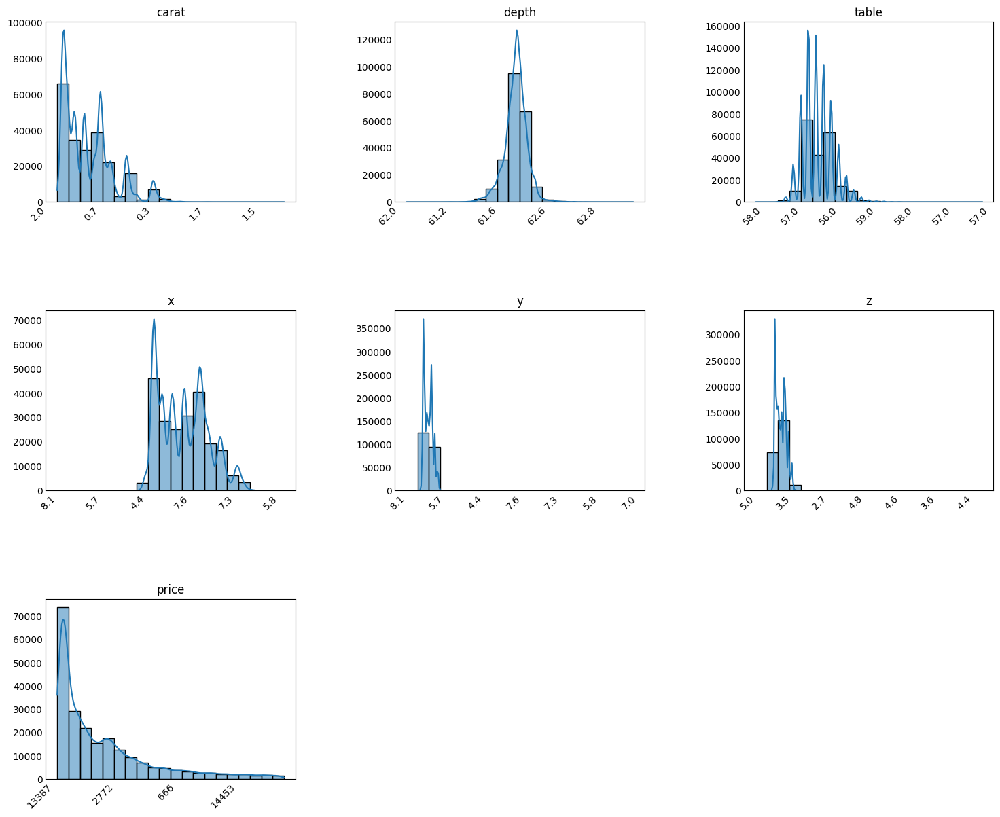

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    # Plot the histogram on the appropriate subplot
    sns.histplot(x=Numeric_value[col], kde=True, bins=20, palette='hls', ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")
    axes[i].tick_params(axis='both', which='both', length=0)
    axes[i].set_xticklabels(labels=Numeric_value[col].round(1), rotation=45, ha='right')
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()

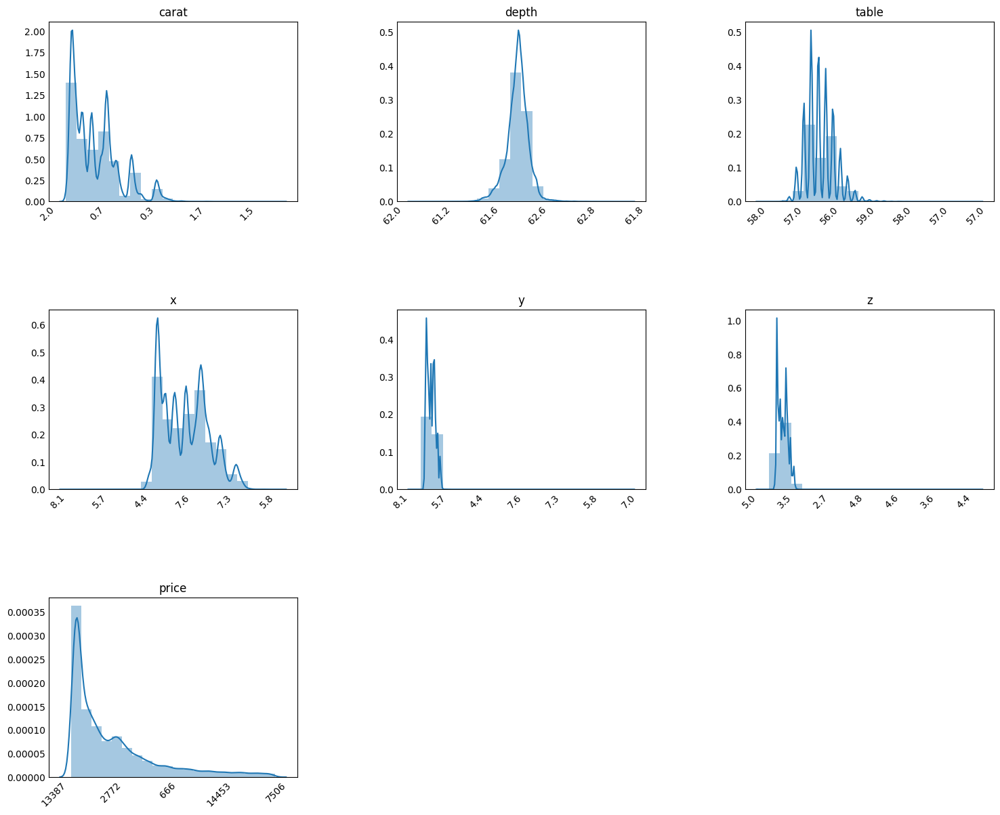

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    sns.distplot(x=Numeric_value[col], kde=True, bins=20, ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")
    axes[i].tick_params(axis='both', which='both', length=0)
    axes[i].set_xticklabels(labels=Numeric_value[col].round(1), rotation=45, ha='right')
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()


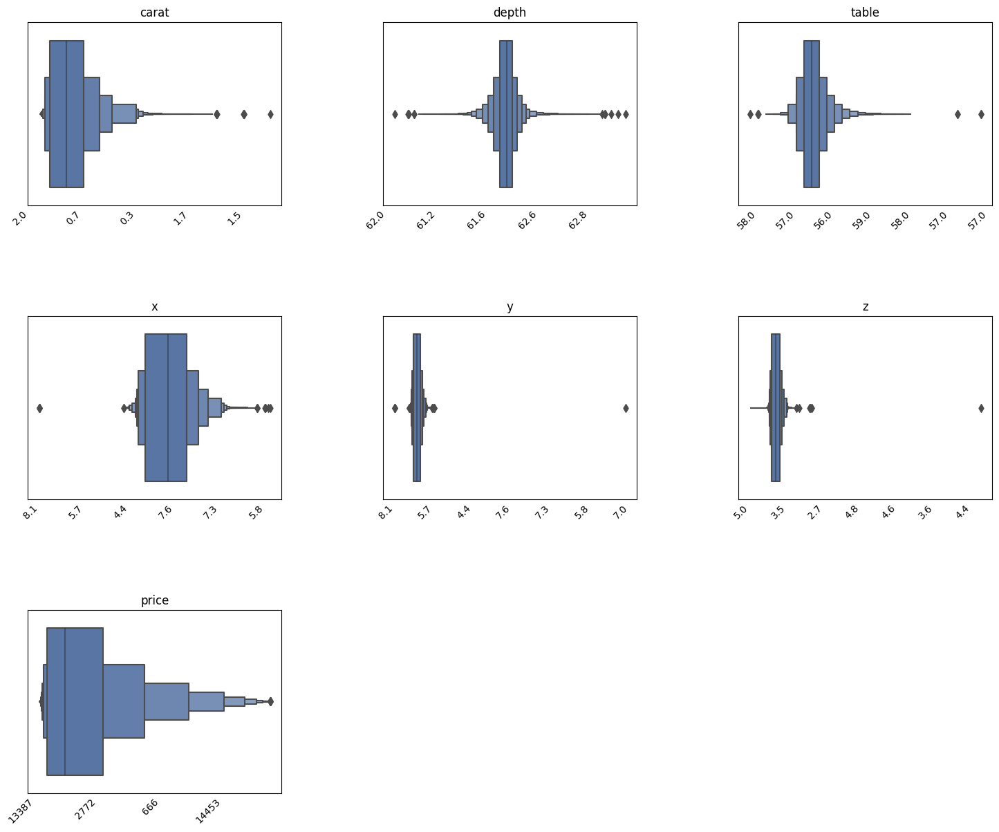

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 20))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    sns.boxenplot(x=Numeric_value[col], palette='deep', ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")
    axes[i].tick_params(axis='both', which='both', length=0)
    axes[i].set_xticklabels(labels=Numeric_value[col].round(1), rotation=45, ha='right')
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()

## Bivariante

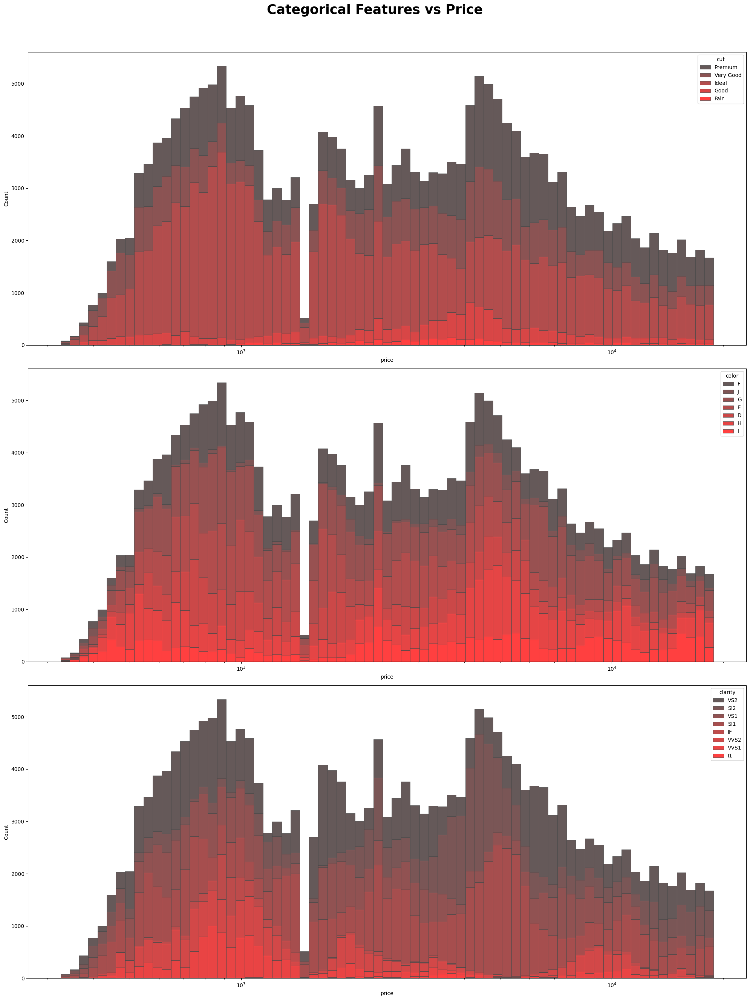

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(20, 27), dpi=100)
ax = ax.flatten()
for i, ft in enumerate(['cut', 'color', 'clarity']):
    sns.histplot(
        data=df,
        x="price", hue=ft,
        multiple="stack",
        palette="dark:red",
        edgecolor=".3",
        linewidth=.5,
        log_scale=True,
        ax=ax[i]
    )
fig.suptitle(f'Categorical Features vs Price\n\n\n', ha='center',  fontweight='bold', fontsize=25)
plt.tight_layout()
plt.show()

In [ ]:
palette = px.colors.sequential.Viridis
target = 'price'
category_orders={'cut': ['Fair', 'Good', 'Very Good', 'Premium', 'Ideal'], 
                 'color': ['D', 'E', 'F', 'G', 'H', 'I', 'J'],
                 'clarity': ['FL', 'IF', 'VVS1', 'VVS2', 'VS1', 'VS2', 'SI1', 'SI2', 'I1', 'I2', 'I3']}

for i, c in enumerate(Category_value):
    fig = px.box(df, x=c, y=target, color=c, category_orders=category_orders, color_discrete_sequence=palette)
    fig.show()

## Multivariante

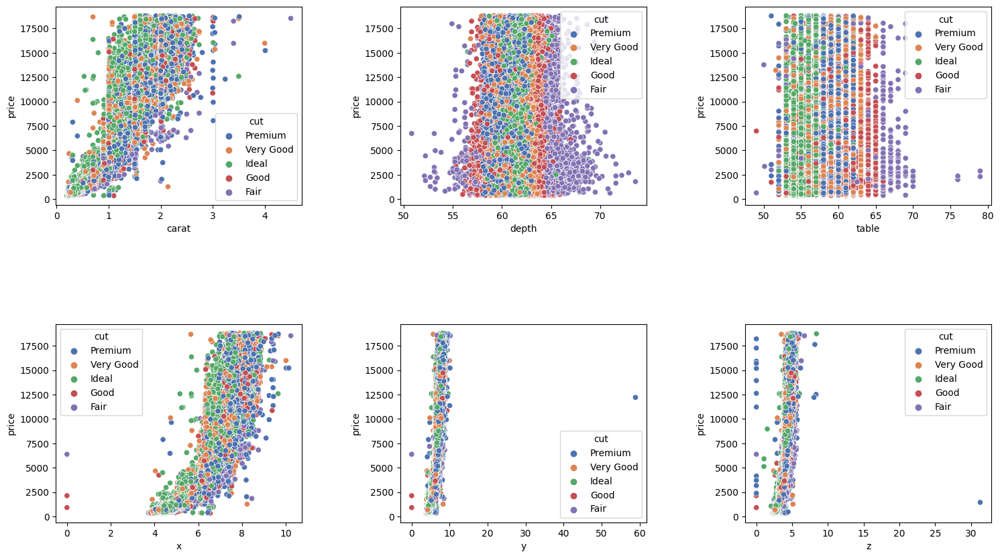

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    if col == 'price':
        break
    else:
        # Add a scatterplot to each subplot
        sns.scatterplot(x=Numeric_value[col], y=Numeric_value['price'],hue=Category_value['cut'], palette='deep', ax=axes[i])
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()


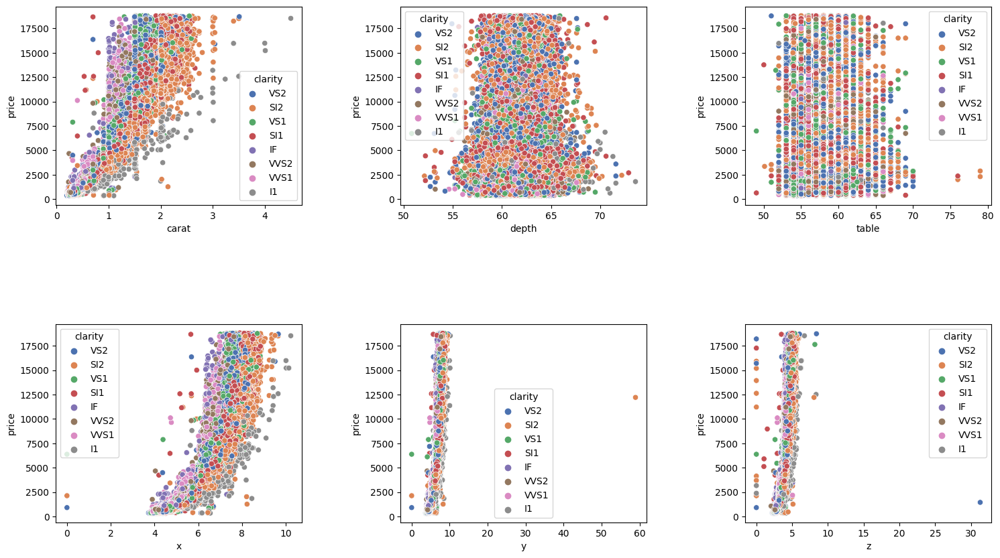

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    if col == 'price':
        break
    else:
        # Add a scatterplot to each subplot
        sns.scatterplot(x=Numeric_value[col], y=Numeric_value['price'],hue=Category_value['clarity'], palette='deep', ax=axes[i])
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()

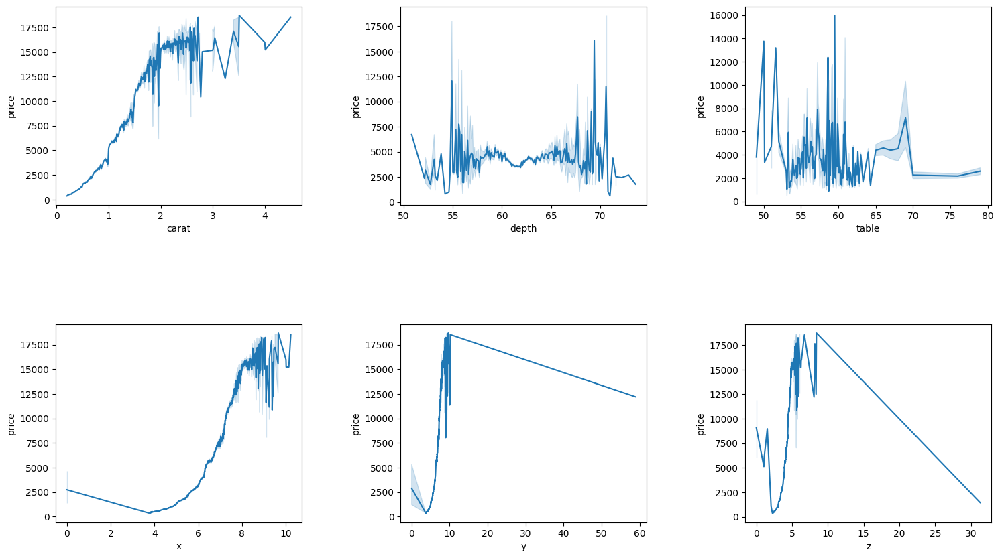

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    if col == 'price':
        break
    else:
        # Add a scatterplot to each subplot
        sns.lineplot(x=Numeric_value[col], y=Numeric_value['price'],palette='deep', ax=axes[i])
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()


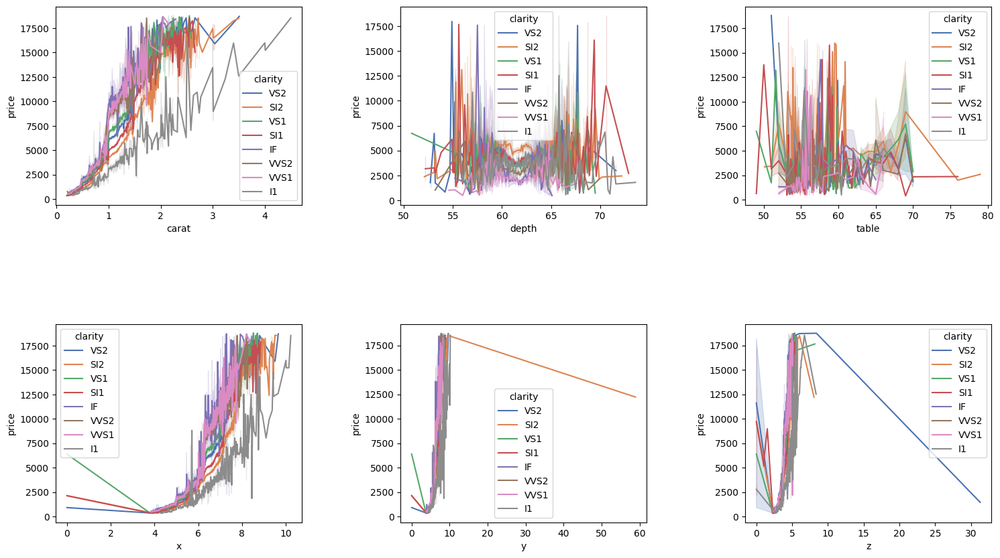

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

for i, col in enumerate(Numeric_value.columns):
    if col == 'price':
        break
    else:
        # Add a scatterplot to each subplot
        sns.lineplot(x=Numeric_value[col], y=Numeric_value['price'],hue=Category_value['clarity'],palette='deep', ax=axes[i])
    
# Hide any unused subplots
for j in range(len(Numeric_value.columns), len(axes)):
    fig.delaxes(axes[j])
    
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)
    
# Display the plot
plt.show()

In [ ]:
px.scatter(df,x='carat',y='price',color='clarity',marginal_y='violin',marginal_x='box',trendline='ols')

In [ ]:
sns.pairplot(data=df, hue='cut', palette='deep')

# Label Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
object_cols = df.select_dtypes(include=['object']).columns

le = LabelEncoder()
for col in object_cols:
    df[col] = le.fit_transform(df[col])

In [ ]:
df

,carat,cut,color,clarity,depth,table,x,y,z,price
0,1.52,3,2,5,62.2,58.0,7.27,7.33,4.55,13619
1,2.03,4,6,3,62.0,58.0,8.06,8.12,5.05,13387
2,0.70,2,3,4,61.2,57.0,5.69,5.73,3.50,2772
3,0.32,2,3,4,61.6,56.0,4.38,4.41,2.71,666
4,1.70,3,3,5,62.6,59.0,7.65,7.61,4.77,14453
...,...,...,...,...,...,...,...,...,...,...
220535,1.11,3,3,2,62.3,58.0,6.61,6.52,4.09,5408
220536,0.33,2,4,1,61.9,55.0,4.44,4.42,2.74,1114
220537,0.51,3,1,5,61.7,58.0,5.12,5.15,3.17,1656
220538,0.27,4,2,7,61.8,56.0,4.19,4.20,2.60,682


In [ ]:
df = df.drop(df[df["x"]==0].index)
df = df.drop(df[df["y"]==0].index)
df = df.drop(df[df["z"]==0].index)

# Removing Outliers

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

carat         0.63
cut           1.00
color         3.00
clarity       3.00
depth         1.20
table         2.00
x             1.82
y             1.80
z             1.12
price      4455.00
dtype: float64


In [ ]:
df_new = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis = 1)]

In [ ]:
df_new.shape

(191702, 10)

In [ ]:
df.shape

(219560, 10)

### Removing outliers which have 0.99 quantile 

In [ ]:
df = df[df['depth'] < df['depth'].quantile(0.99)]
df = df[df['table'] < df['table'].quantile(0.99)]
df = df[df['x'] < df['x'].quantile(0.99)]
df = df[df['y'] < df['y'].quantile(0.99)]
df = df[df['z'] < df['z'].quantile(0.99)]

In [ ]:
df.shape

(208274, 10)

# Coorelation

In [ ]:
df_corr = df.corr()

In [ ]:
df_corr

,carat,cut,color,clarity,depth,table,x,y,z,price
carat,1.000000,0.094968,0.243159,-0.193062,0.025281,0.223721,0.984803,0.984321,0.984179,0.928759
cut,0.094968,1.000000,0.017753,-0.041891,-0.064193,0.364131,0.091211,0.091938,0.085210,0.072701
color,0.243159,0.017753,1.000000,0.026063,0.039202,0.024997,0.224085,0.224192,0.226872,0.146727
clarity,-0.193062,-0.041891,0.026063,1.000000,-0.045183,-0.092532,-0.212522,-0.211619,-0.215383,-0.056235
depth,0.025281,-0.064193,0.039202,-0.045183,1.000000,-0.233733,-0.016846,-0.016512,0.076771,0.003717
table,0.223721,0.364131,0.024997,-0.092532,-0.233733,1.000000,0.228977,0.224175,0.204747,0.169995
x,0.984803,0.091211,0.224085,-0.212522,-0.016846,0.228977,1.000000,0.999069,0.994985,0.889001
y,0.984321,0.091938,0.224192,-0.211619,-0.016512,0.224175,0.999069,1.000000,0.995017,0.888986
z,0.984179,0.085210,0.226872,-0.215383,0.076771,0.204747,0.994985,0.995017,1.000000,0.886640
price,0.928759,0.072701,0.146727,-0.056235,0.003717,0.169995,0.889001,0.888986,0.886640,1.000000


In [ ]:
import numpy as np

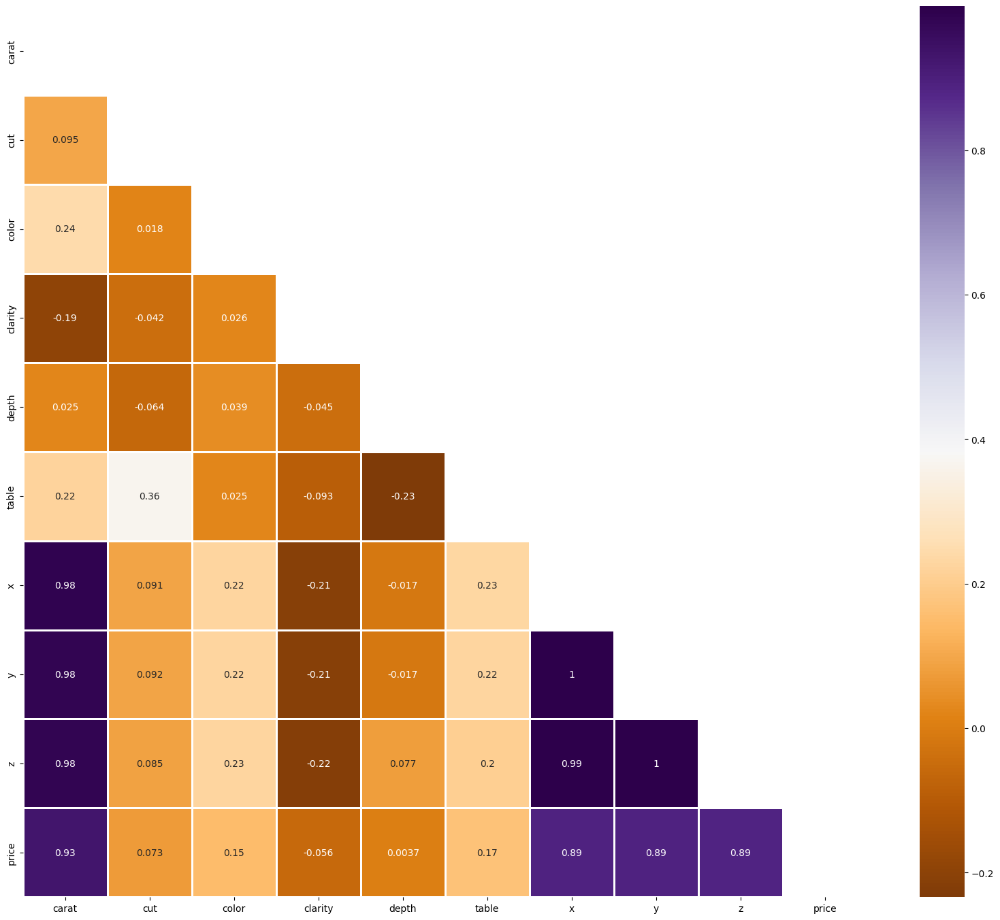

In [ ]:
plt.figure(figsize=(20, 17))
matrix = np.triu(df_corr)
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="PuOr");
plt.show()

#### Observations

###### Price has strong correlation with carat , x,y,z. And low correaltion with depth and table.

###### Also note carat and x both have high positive correlation 0.98.

In [ ]:
X = df.drop('price', axis=1)
y = df['price']

In [ ]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
model.fit(X,y)
print(model.feature_importances_)

[0.24569919 0.00187428 0.03034594 0.05438083 0.00324593 0.00297422
 0.29388903 0.22984938 0.1377412 ]


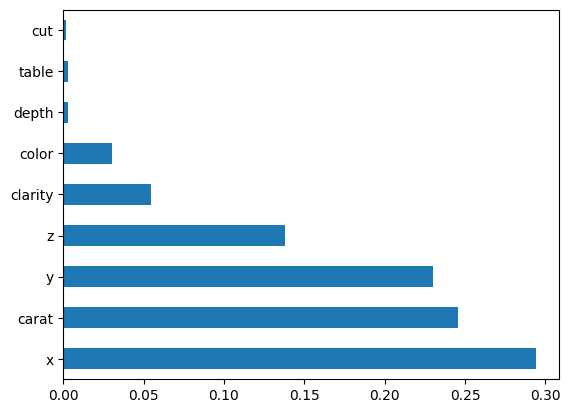

In [ ]:
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [ ]:
top_10 = pd.DataFrame({'Feature Importance': feat_importances.nlargest(10)})

In [ ]:
top_10

,Feature Importance
x,0.293889
carat,0.245699
y,0.229849
z,0.137741
clarity,0.054381
color,0.030346
depth,0.003246
table,0.002974
cut,0.001874


In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [ ]:
X = scaler.fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state= 42)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
from sklearn.model_selection import cross_val_score

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred = reg.predict(X_test)

In [ ]:
#Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred)

# R-squared (R2)
r2 = r2_score(y_test, y_pred)

# Use cross-validation to evaluate the model (optional)
cv_scores = cross_val_score(reg, X, y, cv=5)

# calculate adjusted R-squared
n = len(y_test)
p = X.shape[1]  # number of predictors
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# calculate MAPE
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# calculate explained variance score
evs = explained_variance_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"R-squared score: {r2}")
print("Adjusted R-squared:", adj_r2)
print("MAPE:", mape)
print("Explained Variance Score:", evs)
print("Cross-validation scores:", cv_scores)

Mean Squared Error: 1085127.095807152
R-squared score: 0.9109781990567825
Adjusted R-squared: 0.9109628088992979
MAPE: 30.519300900750018
Explained Variance Score: 0.9109783217221846
Cross-validation scores: [0.91390651 0.91399789 0.91595139 0.91558452 0.89303759]


In [ ]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
tree_reg = DecisionTreeRegressor()

In [ ]:
tree_reg.fit(X_train, y_train)

DecisionTreeRegressor()

In [ ]:
y_pred = tree_reg.predict(X_test)

In [ ]:
#Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred)

# R-squared (R2)
r2 = r2_score(y_test, y_pred)

# Use cross-validation to evaluate the model (optional)
cv_scores = cross_val_score(reg, X, y, cv=5)

# calculate adjusted R-squared
n = len(y_test)
p = X.shape[1]  # number of predictors
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# calculate MAPE
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# calculate explained variance score
evs = explained_variance_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"R-squared score: {r2}")
print("Adjusted R-squared:", adj_r2)
print("MAPE:", mape)
print("Explained Variance Score:", evs)
print("Cross-validation scores:", cv_scores)

Mean Squared Error: 503795.7468946121
R-squared score: 0.9586695375413773
Adjusted R-squared: 0.9586623922992074
MAPE: 10.671715756349284
Explained Variance Score: 0.958670926064114
Cross-validation scores: [0.91390651 0.91399789 0.91595139 0.91558452 0.89303759]


In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf_reg = RandomForestRegressor()

In [ ]:
rf_reg.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
y_pred = rf_reg.predict(X_test)

In [ ]:
#Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred)

# R-squared (R2)
r2 = r2_score(y_test, y_pred)

# Use cross-validation to evaluate the model (optional)
cv_scores = cross_val_score(reg, X, y, cv=5)

# calculate adjusted R-squared
n = len(y_test)
p = X.shape[1]  # number of predictors
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# calculate MAPE
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# calculate explained variance score
evs = explained_variance_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"R-squared score: {r2}")
print("Adjusted R-squared:", adj_r2)
print("MAPE:", mape)
print("Explained Variance Score:", evs)
print("Cross-validation scores:", cv_scores)

Mean Squared Error: 268130.7466126232
R-squared score: 0.9780030541639453
Adjusted R-squared: 0.9779992513150138
MAPE: 8.001342426930156
Explained Variance Score: 0.9780031048477511
Cross-validation scores: [0.91390651 0.91399789 0.91595139 0.91558452 0.89303759]


In [ ]:
import xgboost as xgb

In [ ]:
xgb_reg = xgb.XGBRegressor()

In [ ]:
xgb_reg.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [ ]:
y_pred = xgb_reg.predict(X_test)

In [ ]:
#Mean Absolute Error (MAE)
mse = mean_squared_error(y_test, y_pred)

# R-squared (R2)
r2 = r2_score(y_test, y_pred)

# Use cross-validation to evaluate the model (optional)
cv_scores = cross_val_score(reg, X, y, cv=5)

# calculate adjusted R-squared
n = len(y_test)
p = X.shape[1]  # number of predictors
adj_r2 = 1 - ((1 - r2) * (n - 1) / (n - p - 1))

# calculate MAPE
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

# calculate explained variance score
evs = explained_variance_score(y_test, y_pred)

# Print the evaluation metrics
print(f"Mean Squared Error: {mse}")
print(f"R-squared score: {r2}")
print("Adjusted R-squared:", adj_r2)
print("MAPE:", mape)
print("Explained Variance Score:", evs)
print("Cross-validation scores:", cv_scores)

Mean Squared Error: 247036.69910368536
R-squared score: 0.9797335704377378
Adjusted R-squared: 0.9797300667617921
MAPE: 7.913295706188938
Explained Variance Score: 0.979734602169922
Cross-validation scores: [0.91390651 0.91399789 0.91595139 0.91558452 0.89303759]


# Hyperparamter

### LinearRegression

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Create a linear regression object
model = LinearRegression()

# Define the hyperparameter grid
param_grid = {
    'fit_intercept': [True, False],
}

# Create a grid search object
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search object to the data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters: ", grid_search.best_params_)

# Evaluate the model using the best hyperparameters
y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("MSE: ", mse)
print("R-squared score: ",r2)

Best hyperparameters:  {'fit_intercept': True}
MSE:  1085127.095807152
R-squared score:  0.9109781990567825


### DecisionTree

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV

# Create a decision tree regressor object
model = DecisionTreeRegressor()

# Define hyperparameter grid
param_grid = {
    'max_depth': [3, 4, 5, 6, 7, 8, 9],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create a grid search object
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search object to the data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters found
print('Best hyperparameters:', grid_search.best_params_)

# Evaluate the model using the best hyperparameters
y_pred = grid_search.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("MSE: ", mse)
print("R-squared score: ",r2)

Best hyperparameters: {'max_depth': 9, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2}
MSE:  313040.28692785074
R-squared score:  0.9743187593252658


### RandomForest Regressor

In [ ]:
#Taking to much time
# # Create a Random Forest Regressor object
# model = RandomForestRegressor()

# # Define the hyperparameter grid
# param_grid = {
#     'n_estimators': [100, 200, 500],
#     'max_features': ['auto', 'sqrt'],
#     'max_depth': [5, 10, 15, None],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4],
#     'bootstrap': [True, False]
# }

# # Create a grid search object
# grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# # Fit the grid search object on the training data
# grid_search.fit(X_train, y_train)

# # Print the best hyperparameters and the corresponding mean squared error
# print("Best hyperparameters: ", grid_search.best_params_)
# print("Mean squared error: ", -grid_search.best_score_)

# # Evaluate the model using the best hyperparameters
# y_pred = grid_search.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# r2 = r2_score(y_test, y_pred)
# print("MSE: ", mse)
# print("R-squared score: ",r2)

### XGBRegressor

In [ ]:
#Taking lots of time
# from xgboost import XGBRegressor

# # Define the model
# model = XGBRegressor()

# # Define the grid of hyperparameters to search
# param_grid = {
#     'n_estimators': [100, 200,500],
#     'max_depth': [3, 5, 7],
#     'learning_rate': [0.01, 0.1, 0.3],
#     'subsample': [0.5, 0.7, 1.0],
#     'colsample_bytree': [0.5, 0.7, 1.0],
#     'reg_alpha': [0, 0.1, 0.5],
#     'reg_lambda': [0, 0.1, 0.5],
# }

# # Create a grid search object
# grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# # Fit the grid search object to the data
# grid_search.fit(X_train, y_train)

# # Print the best hyperparameters and their corresponding score
# print("Best Hyperparameters: ", grid_search.best_params_)
# print("Best Score: ", grid_search.best_score_)

# # Evaluate the model using the best hyperparameters
# y_pred = grid_search.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# r2 = r2_score(y_test, y_pred)
# print("MSE: ", mse)
# print("R-squared score: ",r2)

# ANN

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state= 42)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback
import keras.backend as K
import numpy as np

In [ ]:
class R2ScoreCallback(Callback):
    def __init__(self, validation_data):
        super(R2ScoreCallback, self).__init__()
        self.validation_data = validation_data
    
    def on_epoch_end(self, epoch, logs={}):
        y_pred = self.model.predict(self.validation_data[0])
        r2 = 1 - (np.sum((self.validation_data[1] - y_pred)**2) / 
                 (np.sum((self.validation_data[1] - np.mean(self.validation_data[1]))**2)))
        print(f'val_r2: {r2:.4f}')

# Define custom Keras callback for MSE
class MSECallback(Callback):
    def __init__(self, validation_data):
        super(MSECallback, self).__init__()
        self.validation_data = validation_data
    
    def on_epoch_end(self, epoch, logs={}):
        mse = logs['val_loss']
        print(f'val_mse: {mse:.4f}')

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.25, random_state= 42)

# Define the model architecture
model=Sequential()

# Input layer
model.add(Dense(9))

# Hidden Layers
model.add(Dense(8,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(8,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(4,activation='relu'))
model.add(Dense(4,activation='relu'))

# Output layer
model.add(Dense(1))

In [ ]:
# Compile the model with the specified optimizer, loss function, and metrics
model.compile(optimizer='Adam',loss='mse',metrics=['mae'])

In [ ]:
# Fit the model with the specified batch size, number of epochs, and validation data
history = model.fit(x=X_train, y=y_train, validation_data=(X_test, y_test), 
                    batch_size=250 , epochs=400, verbose=0, 
                    callbacks=[R2ScoreCallback(validation_data=(X_test, y_test)), 
                               MSECallback(validation_data=(X_test, y_test))])

1628/1628 [==============================] - 2s 1ms/step


In [ ]:
losses=pd.DataFrame(model.history.history)

In [ ]:
losses.head()

In [ ]:
losses[['loss','val_loss']].plot()

In [ ]:
losses[['mae','val_mae']].plot()

In [ ]:
predictions=model.predict(X_test)
predictions

In [ ]:
score = model.evaluate(X_test, y_test)